# Image Stitching for Panoramic Views

## 01. The mountain top
Imagine you have been climbing a mountain for hours. It is hot, you are sweating and finally you get to the top. A beautiful view opens up infront of your eyes and you bask in the glory of mother nature. A thought pops into your head. I want to save this memory. You pull out your phone, set the panoramic setting and just simply slide across and capture the whole view. Pretty easy and straighforward. But have you ever thought of how this technology works? Lets dive into it an see.

## 02. What is image stitching?

Lets define the problem. Modern cameras/lenses have a set field/angle of view and aspect ratio that limit how much of the world they can see.

[**Field of view**](https://www.digitalcameraworld.com/tutorials/photography-cheat-sheet-what-is-field-of-view-fov) - is simply the observable area that you can see either through your eyes or an optical device, such as a camera lens or telescope.

**Angle of View** - is used to illustrate a lens and sensor combination's angular coverage, independently of what's being photographed.

*There is a difference between Field of view and Angle of view but you can read more in the link above.

<div>
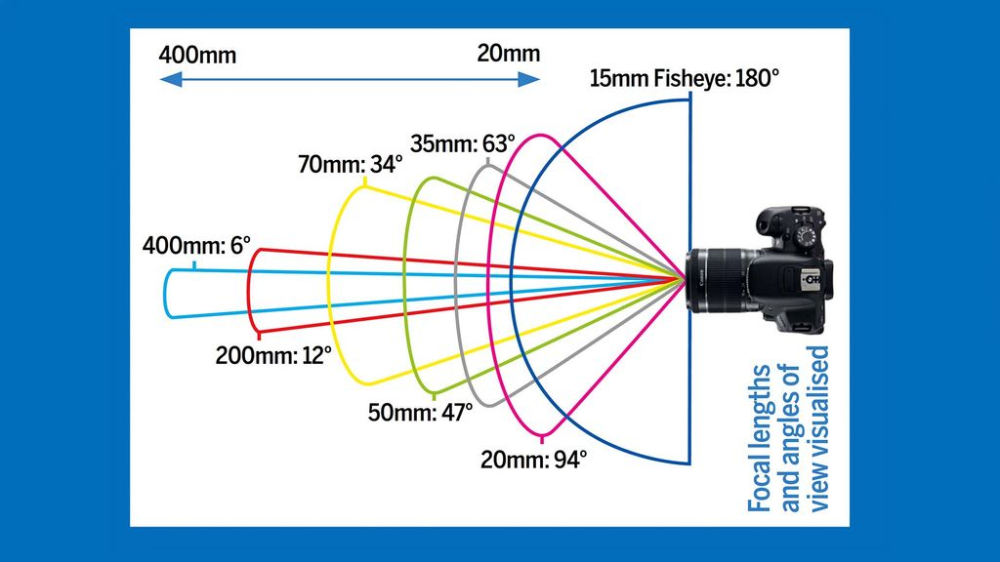
</div>
<div>
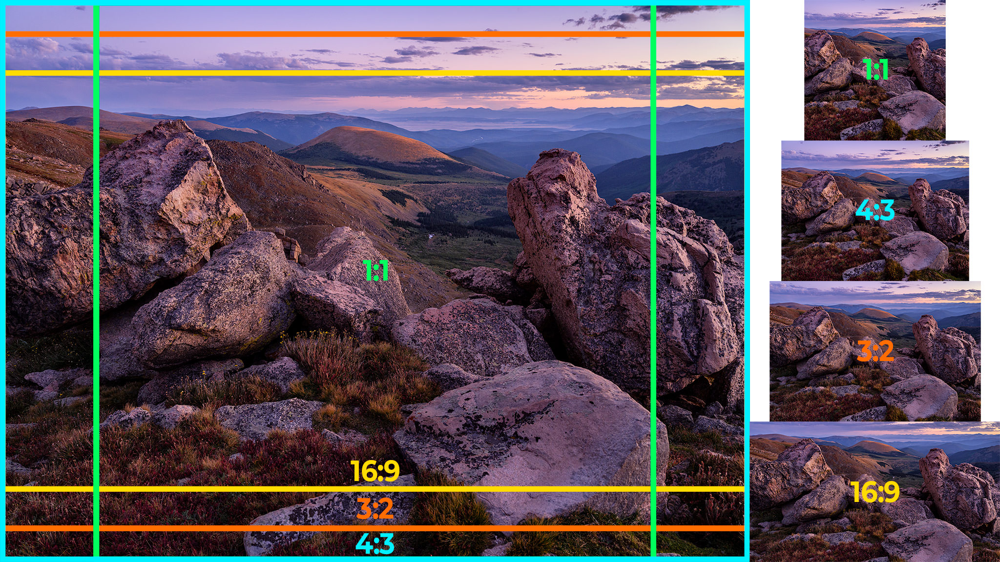
</div>

Most people have seem fish eye 180* view that looks very distorted and even 360* degree from GoPros (called Photo spheres, because they can be mapped to a sphere and explored). The bigger the field of view the more it captures.

If you want to make a panoramic view you have to swap your camera lense with a wider field of view and take a picture. That is a lot of work and carrying of equipment. 

Do not worry. Image stitching to the rescue.

What if you you don't have to swap your lense and just carry a single one. Take a few pictures that slightly overlap and then do the stitching into a panoramic view with software. Sounds great. Lets do a visual since it is the best example when we talk about Computer vision (CV):

### You have this:
<div>
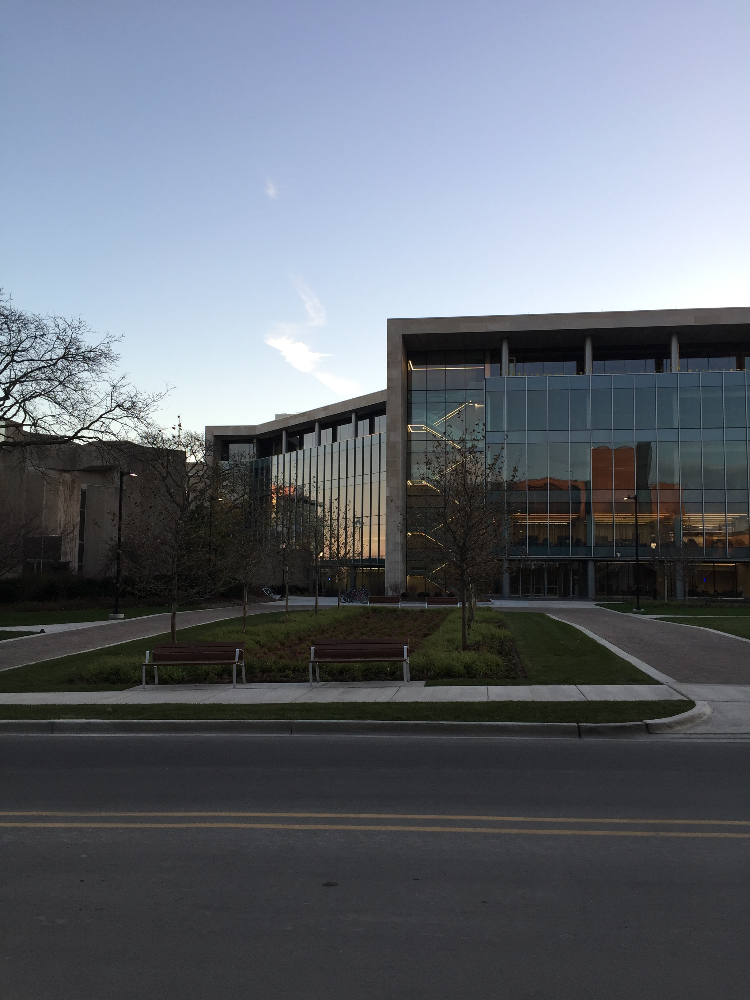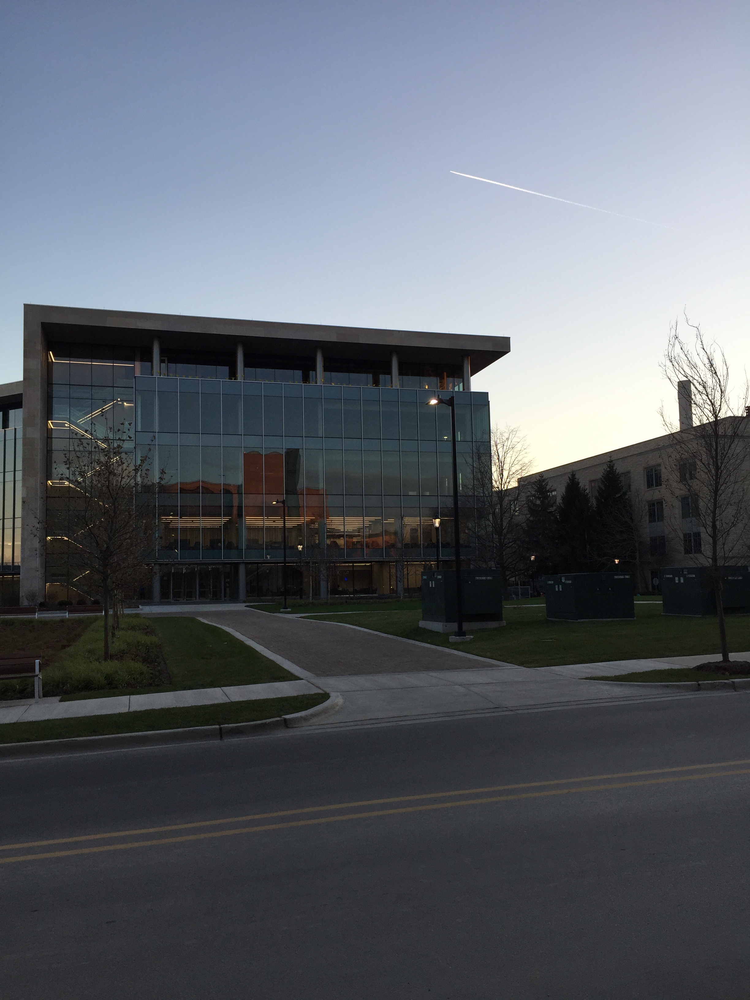
</div>

### You want this:
<div>
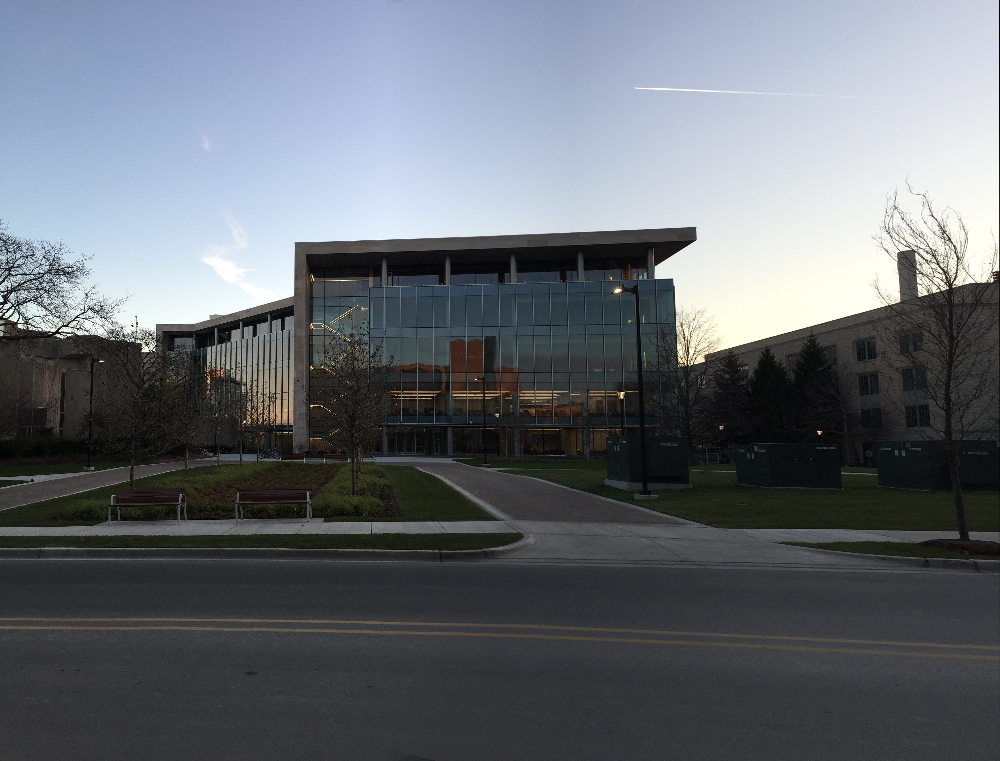
</div>

Pretty simple and easy. With complete solutions (like phone panoramic view or other sotfwares) you can easily achieve a pretty seamless stitching process)

There are a lot of challenges that we have to overcome so lets start. We will use the bottom up approach.

Lets start with the simplest, ugliest implementation and work out way up to just using OpenCV's Stitcher class that does it "in a single line of code".

## The steps of Image Stitching

What are the things we have to do to perform this miracle? The general steps are the following:
1. Detect keypoints and descriptors
3. Match descriptors using BFMatcher
4. Compute homography from matched keypoints
5. Warp img2 into img1's frame and merge

### 1. Detect keypoints and descriptors

#### What is a feature?
- **Feature in Data Science** - features are individual, measurable properties or characteristics within a dataset that are used to train machine learning models. They can be numerical, categorical, text-based, or time-based. Simplifed - the column thingies of the processed dataset.

Then what is a feature when we talk about Computer Vision? (The above explanation does kind of still fit in CV)

- [**Feature in Computer Vision**](https://en.wikipedia.org/wiki/Feature_(computer_vision)) - a feature is a piece of information about the content of an image; typically about whether a certain region of the image has certain properties. Features may be specific structures in the image such as points, edges or objects.

[OpenCV gives us a more philosophical definition](https://docs.opencv.org/4.x/df/d54/tutorial_py_features_meaning.html) - we are looking for specific patterns or specific features which are unique, can be easily tracked and can be easily compared. If we go for a definition of such a feature, we may find it difficult to express it in words, but we know what they are. If someone asks you to point out one good feature which can be compared across several images, you can point out one. That is why even small children can simply play these games. We search for these features in an image, find them, look for the same features in other images and align them. That's it. (In jigsaw puzzle, we look more into continuity of different images). **All these abilities are present in us inherently.**

#### Why bother with these Features in the first place? 
We can use feature detction (we will look at such algorithms in a bit) to find them and try to match the features of 1 image to the features of another image and use them as keypoints/anchor points to know where they "intersect"/overlap.

Most used algorithms for Feature Detection in Computer Vision: 
- SIFT (Scale-Invariant Feature Transform)
- ORB (Oriented FAST and Rotated BRIEF)
- SURF (Speeded-Up Robust Features)

*There are other feature detection algorithms like AKAZE, BRISK, and FREAK that offer different trade-offs in terms of speed and robustness. 


#### SIFT (Scale-Invariant Feature Transform)

Before 21st century a couple of corner detection algorithms existed:
- [A Combined Corner and Edge Detector by Chris Harris & Mike Stephens](https://home.cis.rit.edu/~cnspci/references/dip/feature_extraction/harris1988.pdf)
- [Shi-Tomasi Corner Detector](https://docs.opencv.org/4.x/d4/d8c/tutorial_py_shi_tomasi.html) - Improvement on the Harris Corner Detector
- etc.

A good thing about these algos is that they are rotation-invariant, which means, even if the image is rotated, we can find the same corners.\
Problem is they are not scale invariant. If we zoom in on an "corner" it will stop picking it up.

When trying to match objects it is easier if we can remove variables like size and orientation. SIFT does this and is more robust than its predecessors.

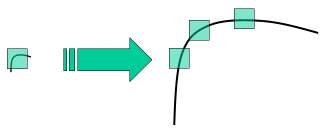

In 2004, D.Lowe, University of British Columbia, came up with a new algorithm, Scale Invariant Feature Transform (SIFT) in his paper, **Distinctive Image Features from Scale-Invariant Keypoints**, which extract keypoints and compute its descriptors.

[Interesting Point](https://www.youtube.com/watch?v=wcqbiHonfbo) / Feature:
- Needs to have a rich image content (brightness variation, color variation, etc.) within the local window. It needs a ceratin kind of uniqueness.
- Needs to have a well-defined representation(signature) for matching/comparing with other points
- Needs to have a well-defined position in the image
- Needs to be invariant to image rotation and scaling
- Needs to be insensitive to lighting changes

Are edges interesting points?
- Well no, because if you slide along them they are all the same. Position/lighting problems. Not unique enough.

Are corners interesting points?
- Have been in the past for simpler applications. Rare to see.

Are blobs interesting points?
- Yes. They are very unique. Fixed positions.

SIFT uses blobs for features/interesting points.

<div>
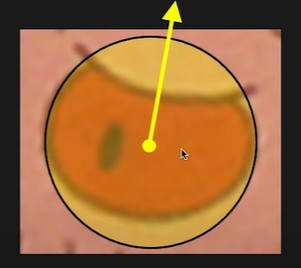
</div>

For a Blob-like Feature to be useul, we need to:
- Locathe the blob
- Determine its size
- Determine its orientation
- Formulate a sescription or signature that is independent of size and orientation

How to find blobs?
- We will apply the 2nd derivative of the Gaussian Transform but apply if or multiple Sigmas.
There are 5 steps:
1. Scale-space Extrema Detection
2. Keypoint Localization
3. Orientation Assignment
4. Keypoint Descriptor
5. Keypoint Matching

## Setup

We will be working with 2 images:
- image1.jpg
- image2.jpg

Original naming. I know! \
Feel free to put in your own photos just capture 2 images that slightly overlap and put them in the folder: **./Project images/Working images**


In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img1 = cv2.imread('Project images/Working images/image1.jpg')
img2 = cv2.imread('Project images/Working images/image2.jpg')

## Version 0.1 Overlap the images

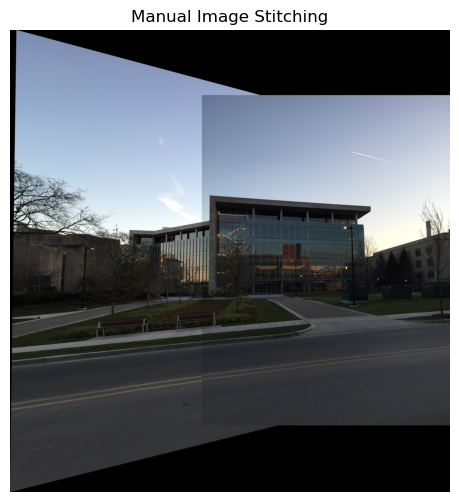

In [40]:
# Detect ORB keypoints and descriptors
orb = cv2.ORB_create(2000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Match descriptors using BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = sorted(bf.match(des1, des2), key=lambda x: x.distance)

# Compute homography from matched keypoints
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)
H, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

# Warp img2 into img1's frame
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]
corners = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
warped_corners = cv2.perspectiveTransform(corners, H)
all_corners = np.concatenate((warped_corners, np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)))
[xmin, ymin] = np.int32(all_corners.min(axis=0).ravel())
[xmax, ymax] = np.int32(all_corners.max(axis=0).ravel())
translate = [-xmin, -ymin]
H_translate = np.array([[1, 0, translate[0]], [0, 1, translate[1]], [0, 0, 1]])

# Warp and merge
result = cv2.warpPerspective(img2, H_translate @ H, (xmax - xmin, ymax - ymin))
result[translate[1]:h1+translate[1], translate[0]:w1+translate[0]] = img1

# Show result
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Manual Image Stitching")
plt.show()

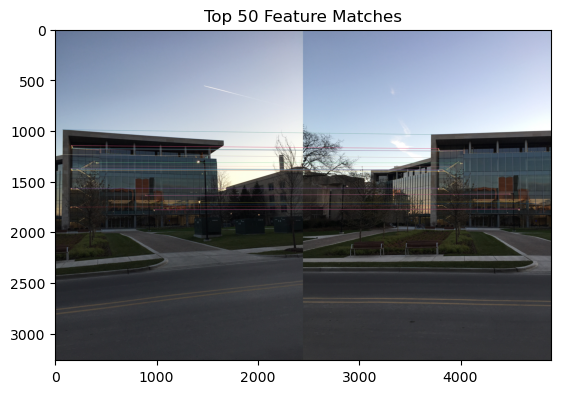

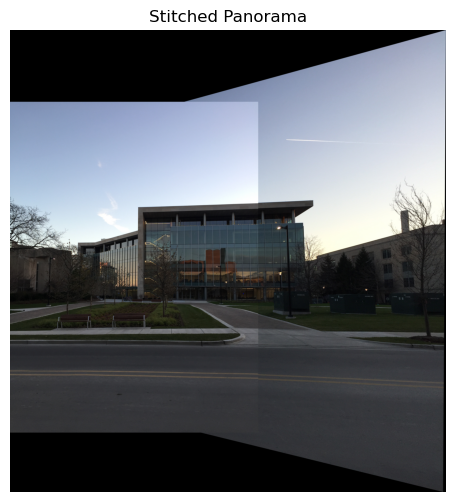

In [41]:
# Image Stitching Project: Feature Matching + Homography + Blending

# Convert to gra
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Step 1: Detect ORB keypoints and descriptors
orb = cv2.ORB_create(nfeatures=2000)
kp1, des1 = orb.detectAndCompute(img1_gray, None)
kp2, des2 = orb.detectAndCompute(img2_gray, None)

# Step 2: Match features using Brute Force matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draw top 50 matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None, flags=2)
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title("Top 50 Feature Matches")
plt.show()

# Step 3: Find Homography Matrix using matched keypoints
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Step 4: Warp img1 into the perspective of img2
# Compute size of the resulting panorama
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]

# Get the canvas dimensions by warping corners of img1
corners_img1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
warped_corners = cv2.perspectiveTransform(corners_img1, H)
all_corners = np.concatenate((warped_corners, np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)), axis=0)
[xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

translation_dist = [-xmin, -ymin]

H_translation = np.array([[1, 0, translation_dist[0]],
                          [0, 1, translation_dist[1]],
                          [0, 0, 1]])

result = cv2.warpPerspective(img1, H_translation @ H, (xmax - xmin, ymax - ymin))
result[translation_dist[1]:h2+translation_dist[1], translation_dist[0]:w2+translation_dist[0]] = img2

# Step 5: Display stitched image
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Stitched Panorama")
plt.axis('off')
plt.show()


ChatGPT test

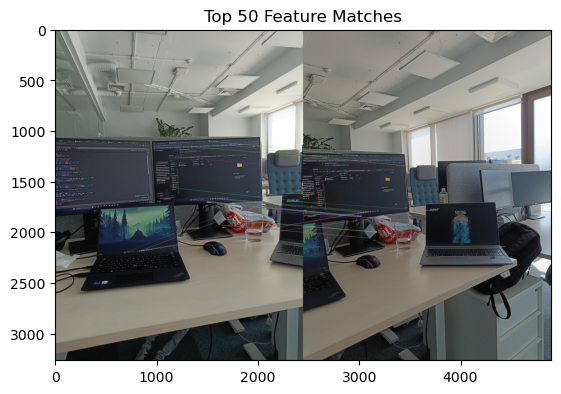

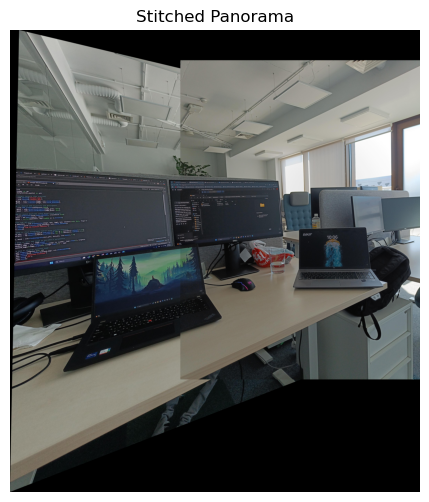

In [17]:
# Image Stitching Project: Feature Matching + Homography + Blending

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images (ensure they overlap)
img1 = cv2.imread('image1.jpg')
img2 = cv2.imread('image2.jpg')
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Step 1: Detect ORB keypoints and descriptors
orb = cv2.ORB_create(nfeatures=2000)
kp1, des1 = orb.detectAndCompute(img1_gray, None)
kp2, des2 = orb.detectAndCompute(img2_gray, None)

# Step 2: Match features using Brute Force matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draw top 50 matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None, flags=2)
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title("Top 50 Feature Matches")
plt.show()

# Step 3: Find Homography Matrix using matched keypoints
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Step 4: Warp img1 into the perspective of img2
# Compute size of the resulting panorama
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]

# Get the canvas dimensions by warping corners of img1
corners_img1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
warped_corners = cv2.perspectiveTransform(corners_img1, H)
all_corners = np.concatenate((warped_corners, np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)), axis=0)
[xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

translation_dist = [-xmin, -ymin]

H_translation = np.array([[1, 0, translation_dist[0]],
                          [0, 1, translation_dist[1]],
                          [0, 0, 1]])

result = cv2.warpPerspective(img1, H_translation @ H, (xmax - xmin, ymax - ymin))
result[translation_dist[1]:h2+translation_dist[1], translation_dist[0]:w2+translation_dist[0]] = img2

# Step 5: Display stitched image
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Stitched Panorama")
plt.axis('off')
plt.show()


## Geeks for Geeks


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
img1 = cv2.imread('image1.jpg')
img2 = cv2.imread('image2.jpg')

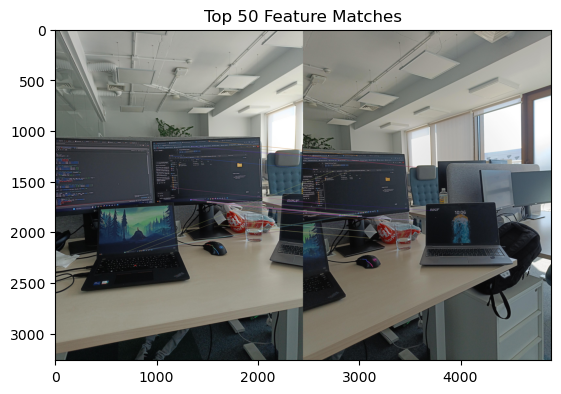

In [3]:
# Step 1: Detect ORB keypoints and descriptors
orb = cv2.ORB_create(nfeatures=2000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Step 2: Match features using Brute Force matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draw top 50 matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None, flags=2)
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title("Top 50 Feature Matches")
plt.show()

In [4]:
# Extract location of good matches
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

# Compute homography
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
H

array([[ 1.52970510e+00,  3.78242178e-02, -1.64639297e+03],
       [ 3.86148948e-01,  1.27810278e+00, -3.08803685e+02],
       [ 2.61474780e-04, -3.82898090e-05,  1.00000000e+00]])

In [7]:
# Get the dimensions of the images
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]

# Get the canvas dimesions
pts = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
print(pts)
dst = cv2.perspectiveTransform(pts, H)
img2_warped = cv2.warpPerspective(img2, H, (w1 + w2, h1))
cv2.imshow("Warped", img2_warped)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Place the first image on the canvas
img2_warped[0:h1, 0:w1] = img1

[[[   0.    0.]]

 [[   0. 3264.]]

 [[2448. 3264.]]

 [[2448.    0.]]]


In [6]:
# Simple blending technique
result = img2_warped

cv2.imshow('Result', result)
cv2.waitKey(0)
cv2.destroyAllWindows()

## OpenCV

In [8]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
 
img1 = cv.imread('image1.jpg',cv.IMREAD_GRAYSCALE)          # queryImage
img2 = cv.imread('image2.jpg',cv.IMREAD_GRAYSCALE) # trainImage
 
# Initiate ORB detector
orb = cv.ORB_create()
 
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

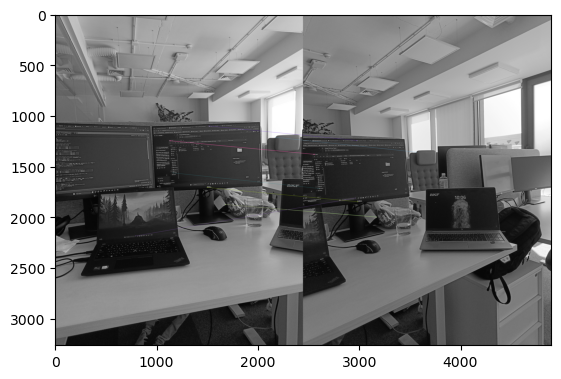

(<matplotlib.image.AxesImage at 0x280ef7f6210>, None)

In [9]:
# create BFMatcher object
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
 
# Match descriptors.
matches = bf.match(des1,des2)
 
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)
 
# Draw first 10 matches.
img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
 
plt.imshow(img3),plt.show()

## Stitcher


stitching completed successfully. %s saved!
Done


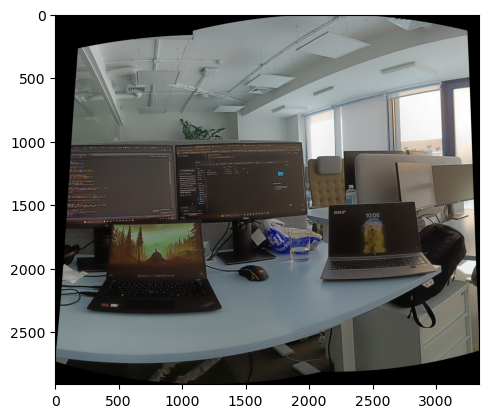

In [15]:
# read input images
img1 = cv2.imread('image1.jpg')
img2 = cv2.imread('image2.jpg')
imgs = []
imgs.append(img1)#![stitching]
imgs.append(img2)#![stitching]
stitcher = cv.Stitcher.create(cv.Stitcher_PANORAMA)
status, pano = stitcher.stitch(imgs)
if status != cv.Stitcher_OK:
    print("Can't stitch images, error code = %d" % status)
#![stitching]cv.imwrite(args.output, pano)
print("stitching completed successfully. %s saved!")
print('Done')
plt.imshow(pano)

# ChatGPT white balance

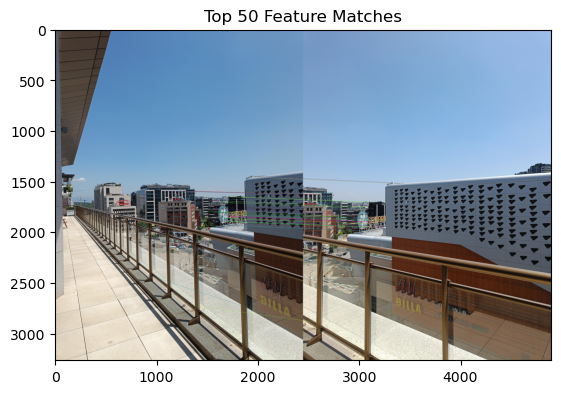

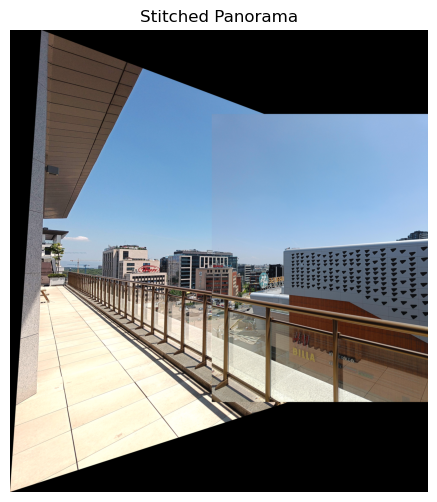

In [24]:
# Image Stitching Project: Feature Matching + Homography + Blending

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images (ensure they overlap)
img1 = cv2.imread('image1.jpg')
img2 = cv2.imread('image2.jpg')

# Step 0: Contrast and brightness normalization based on overlapping region
# We'll do this after estimating homography and overlap mask

img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Step 1: Detect ORB keypoints and descriptors
orb = cv2.ORB_create(nfeatures=2000)
kp1, des1 = orb.detectAndCompute(img1_gray, None)
kp2, des2 = orb.detectAndCompute(img2_gray, None)

# Step 2: Match features using Brute Force matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draw top 50 matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None, flags=2)
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title("Top 50 Feature Matches")
plt.show()

# Step 3: Find Homography Matrix using matched keypoints
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Step 4: Warp img1 into the perspective of img2
# Compute size of the resulting panorama
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]

# Get the canvas dimensions by warping corners of img1
corners_img1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
warped_corners = cv2.perspectiveTransform(corners_img1, H)
all_corners = np.concatenate((warped_corners, np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)), axis=0)
[xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

translation_dist = [-xmin, -ymin]

H_translation = np.array([[1, 0, translation_dist[0]],
                          [0, 1, translation_dist[1]],
                          [0, 0, 1]])

# Warp img1
warped_img1 = cv2.warpPerspective(img1, H_translation @ H, (xmax - xmin, ymax - ymin))

# Create mask of overlapping area
warped_mask1 = cv2.warpPerspective(np.ones((h1, w1), dtype=np.uint8), H_translation @ H, (xmax - xmin, ymax - ymin))
mask2 = np.zeros((ymax - ymin, xmax - xmin), dtype=np.uint8)
mask2[translation_dist[1]:h2+translation_dist[1], translation_dist[0]:w2+translation_dist[0]] = 1

overlap_mask = cv2.bitwise_and(warped_mask1, mask2)

# Extract overlapping pixels
overlap_region1 = cv2.bitwise_and(warped_img1, warped_img1, mask=overlap_mask)
overlap_region2 = cv2.bitwise_and(img2, img2, mask=overlap_mask[translation_dist[1]:h2+translation_dist[1], translation_dist[0]:w2+translation_dist[0]])

# Compute mean brightness ratio and adjust brightness
mean1 = cv2.mean(overlap_region1, mask=overlap_mask)[:3]
mean2 = cv2.mean(overlap_region2, mask=overlap_mask[translation_dist[1]:h2+translation_dist[1], translation_dist[0]:w2+translation_dist[0]])[:3]

scale = np.array(mean2) / (np.array(mean1) + 1e-6)
adjusted_img1 = np.clip(img1 * scale, 0, 255).astype(np.uint8)

# Warp adjusted img1 again
warped_img1 = cv2.warpPerspective(adjusted_img1, H_translation @ H, (xmax - xmin, ymax - ymin))

# Compose the final panorama
result = warped_img1.copy()
result[translation_dist[1]:h2+translation_dist[1], translation_dist[0]:w2+translation_dist[0]] = img2

# Step 5: Display stitched image
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Stitched Panorama")
plt.axis('off')
plt.show()

## Resources

Resources:
- [Aspect Ratio](https://photographylife.com/aspect-ratio)
- [Field of View/Angle of View](https://www.digitalcameraworld.com/tutorials/photography-cheat-sheet-what-is-field-of-view-fov)
- [What is a Feature](https://docs.opencv.org/4.x/df/d54/tutorial_py_features_meaning.html)
- [Interesting Point](https://www.youtube.com/watch?v=wcqbiHonfbo)

Bibliograpy:
- [C. Harris and M. Stephens. A Combined Corner and Edge Detector. In C. J. Taylor, editors, Proceedings of the Alvey Vision Conference, pages 23.1-23.6. Alvey Vision Club, September 1988. doi:10.5244/C.2.23.](https://www.bmva-archive.org.uk/bmvc/1988/avc-88-023.pdf)
- [Lowe, David G.. “Distinctive Image Features from Scale-Invariant Keypoints.” International Journal of Computer Vision 60 (2004): 91-110.](https://cs.gmu.edu/~zduric/cs774/Papers/Lowe-Features-IJCV.pdf)